In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random

# Read Image

In [2]:
img = cv2.imread("DIP-Class/white_circle_small.png") # Test Image
img = cv2.imread("../Resource-Images/Mini.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img = cv2.resize(img,(512,512))

[ WARN:0@0.784] global loadsave.cpp:244 findDecoder imread_('DIP-Class/white_circle_small.png'): can't open/read file: check file path/integrity


# Copy an Instance

In [3]:
original_img = img.copy()

In [4]:
height,width = img.shape

# Adding Salt and Pepper

In [5]:
def make_noisy_image(img, percentage_of_salt_pepper):
    
    noisy_img = img.copy()


    total_pixel = height*width
    effected_pixels = round(percentage_of_salt_pepper*total_pixel)
    # print("Total Pixels : ",total_pixel)

    # print("Effected Pixels:", round(percentage_of_salt_pepper*total_pixel))

    for i in range (effected_pixels):
        # generate two random index
        rand_i = random.randint(0,height-1)
        rand_j = random.randint(0,width-1)
        
        
        if i%2 == 0:
            noisy_img[rand_i][rand_j] = 255 # Pepper
        else:
            noisy_img[rand_i][rand_j] = 0 # Salt

    
    return noisy_img

# Test of Salt-Pepper Function

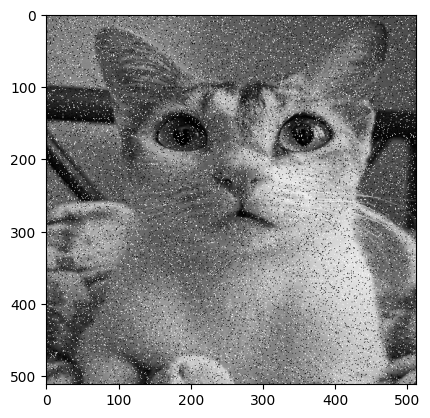

In [6]:
plt.imshow(make_noisy_image(original_img,0.1),cmap='gray')

# PSNR Calculator

In [7]:
def calculate_PSNR(img,noisy_img):
    img = img.astype(np.float128)
    noisy_img = noisy_img.astype(np.float128)
    
    max_pixel = np.max(img)
    mean_squared_error = np.mean((img - noisy_img)**2)
    PSNR = 20*np.log(max_pixel)-10*np.log(mean_squared_error)
    
    return round(PSNR,2)

# Test PSNR Calculator

In [8]:
calculate_PSNR(img,img)

/var/folders/5_/_0y1j83907xb246mlhjdp_xr0000gn/T/ipykernel_8315/3483700541.py:7: RuntimeWarning: divide by zero encountered in log
  PSNR = 20*np.log(max_pixel)-10*np.log(mean_squared_error)


inf

In [9]:
calculate_PSNR(make_noisy_image(img,0.1),img)

36.01

In [10]:
calculate_PSNR(make_noisy_image(img,0.5),img)

21.8

In [11]:
calculate_PSNR(make_noisy_image(img,0.9),img)

17.69

In [12]:
calculate_PSNR(make_noisy_image(img,1),img)

17.05

In [13]:
noisy_img = make_noisy_image(img,0.10)

# Filtering Image Function

In [14]:
def filter_image(img,filter_type):
    filtered_image = img.copy()
    
    mask_size = 5 #3x3

    if filter_type == "median":
        for i in range (mask_size,height-mask_size):
            for j in range(mask_size,width-mask_size):
                median = np.median(noisy_img[i-mask_size:i+mask_size,j-mask_size:j+mask_size])
                filtered_image[i][j] = median
                
        return filtered_image
    
    elif filter_type== "average":
        for i in range (mask_size,height-mask_size):
            for j in range(mask_size,width-mask_size):
                avg = np.mean(noisy_img[i-mask_size:i+mask_size,j-mask_size:j+mask_size])
                filtered_image[i][j] = avg
                
        return filtered_image
        

# Apply Median Filter

### Subplots

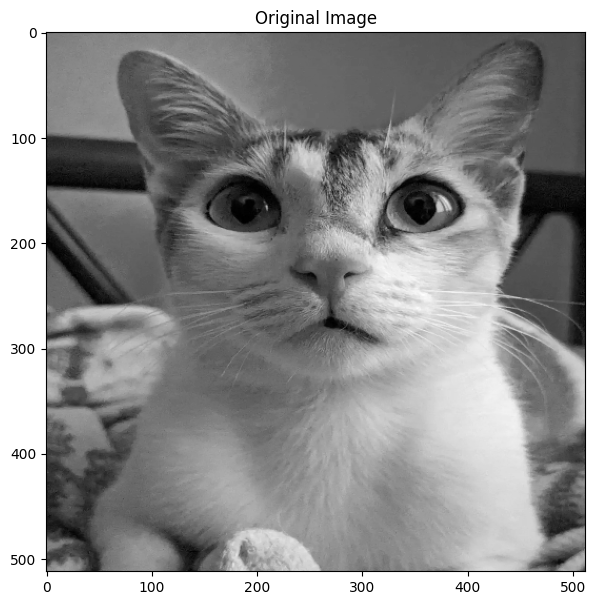

/var/folders/5_/_0y1j83907xb246mlhjdp_xr0000gn/T/ipykernel_8315/1752732245.py:19: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(10,2,i) #3


Generated Noisy Image Image : 1/20
Generated Filtered Image : 2/20
Generated Noisy Image Image : 3/20
Generated Filtered Image : 4/20
Generated Noisy Image Image : 5/20
Generated Filtered Image : 6/20
Generated Noisy Image Image : 7/20
Generated Filtered Image : 8/20
Generated Noisy Image Image : 9/20
Generated Filtered Image : 10/20
Generated Noisy Image Image : 11/20
Generated Filtered Image : 12/20
Generated Noisy Image Image : 13/20
Generated Filtered Image : 14/20
Generated Noisy Image Image : 15/20
Generated Filtered Image : 16/20
Generated Noisy Image Image : 17/20
Generated Filtered Image : 18/20
Generated Noisy Image Image : 19/20
Generated Filtered Image : 20/20


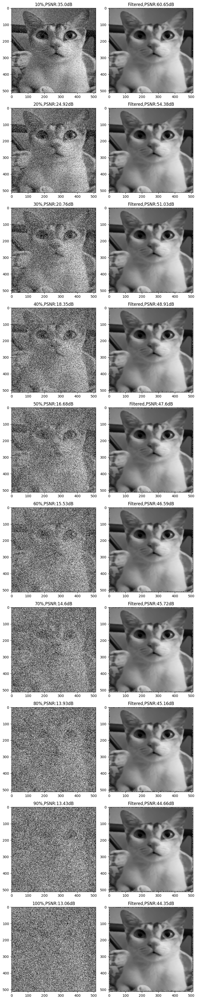

In [15]:
# Original Image Plot
plt.figure(figsize=(7,7))
plt.imshow(original_img,cmap='gray')
plt.title("Original Image")
plt.show()

plt.figure(figsize=(8,40))
plt.title("Noisy Image & Median Filter")
# Noisy - Filtered Image Plot

cnt = 10

for i in range(1,21,1):
    
    if i%2==1:
        # Noisy Image Show
        cur_noisy_img = make_noisy_image(img,float(i/10))

        plt.subplot(10,2,i) #3
    
        plt.imshow(cur_noisy_img,cmap='gray')
        plt.title(f"{cnt}%,PSNR:{calculate_PSNR(img,cur_noisy_img)}dB")
        cnt+=10
        print(f"Generated Noisy Image Image : {i}/20")

    else:
        # Filtered Image Show
        cur_filtered_img = filter_image(cur_noisy_img,"median")

        plt.subplot(10,2,i) #3

        plt.imshow(cur_filtered_img,cmap='gray')
        plt.title(f"Filtered,PSNR:{calculate_PSNR(img,cur_filtered_img)}dB")
        
        print(f"Generated Filtered Image : {i}/20")


plt.tight_layout()
plt.savefig("PSNR_TEST_MEDIAN.jpg")
plt.show()    


# Apply Average Filter

/var/folders/5_/_0y1j83907xb246mlhjdp_xr0000gn/T/ipykernel_8315/4146089305.py:12: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(10,2,i) #3


Generated Noisy Image Image : 1/20
Generated Filtered Image : 2/20
Generated Noisy Image Image : 3/20
Generated Filtered Image : 4/20
Generated Noisy Image Image : 5/20
Generated Filtered Image : 6/20
Generated Noisy Image Image : 7/20
Generated Filtered Image : 8/20
Generated Noisy Image Image : 9/20
Generated Filtered Image : 10/20
Generated Noisy Image Image : 11/20
Generated Filtered Image : 12/20
Generated Noisy Image Image : 13/20
Generated Filtered Image : 14/20
Generated Noisy Image Image : 15/20
Generated Filtered Image : 16/20
Generated Noisy Image Image : 17/20
Generated Filtered Image : 18/20
Generated Noisy Image Image : 19/20
Generated Filtered Image : 20/20


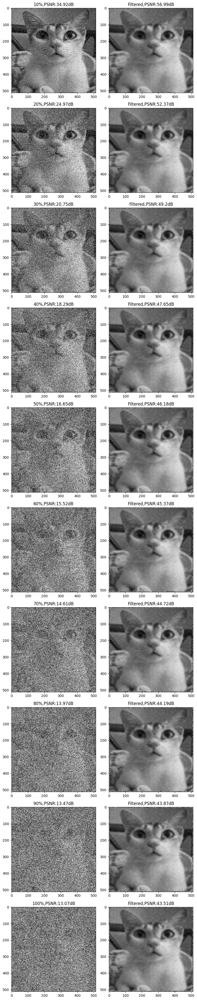

In [16]:
plt.figure(figsize=(8,40))
plt.title("Noisy Image & Average Filter")
# Noisy - Filtered Image Plot
cnt = 10

for i in range(1,21,1):
    
    if i%2==1:
        # Noisy Image Show
        cur_noisy_img = make_noisy_image(img,float(i/10))

        plt.subplot(10,2,i) #3
    
        plt.imshow(cur_noisy_img,cmap='gray')
        plt.title(f"{cnt}%,PSNR:{calculate_PSNR(img,cur_noisy_img)}dB")
        cnt+=10
        print(f"Generated Noisy Image Image : {i}/20")

    else:
        # Filtered Image Show
        cur_filtered_img = filter_image(cur_noisy_img,"average")

        plt.subplot(10,2,i) #3

        plt.imshow(cur_filtered_img,cmap='gray')
        plt.title(f"Filtered,PSNR:{calculate_PSNR(img,cur_filtered_img)}dB")
        
        print(f"Generated Filtered Image : {i}/20")


plt.tight_layout()
plt.savefig("PSNR_TEST_AVG.jpg")
plt.show()    
